In [1]:
import torch

print(torch.__version__)
print(torch.version.cuda)

1.7.1
10.1


# 1. SetUp and Download pretrained model

In [ ]:
#@markdown 1.1 Git clone Make_your_charactor

# -----------------------------
# Git Clone (Private Repository)
# -----------------------------

#!git clone https://github.com/happy-jihye/Cartoon-StyleGan2.git

# -----------------------------
#@markdown 1.2 Download CLIP from openAI
# -----------------------------

# Installing CLIP

import os
os.chdir(f'./')

!pip install ftfy regex tqdm ninja gdown
!pip install git+https://github.com/openai/CLIP.git


In [ ]:
#@markdown Download StyleGAN2 pretrained model !

from utils import download_pretrained_model

DownLoad_All = False #@param {type:"boolean"}
DownLoad_Single_Pretrained_Model = 'factor' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']

if DownLoad_All:
  download_pretrained_model()
else:
  
  download_pretrained_model(False, "ffhq256.pt")
  download_pretrained_model(False, f"{DownLoad_Single_Pretrained_Model}.pt")

In [ ]:
#@markdown Download your own pretrained model !

%cd networks

url = 'https://drive.google.com/file/d/1P5T6DL3Cl8T74HqYE0rCBQxcq15cipuw/view' #@param {type:'string'}
id= url.split('/')[-2]
!gdown --id $id 

%cd ..

## Generate Images using Pretrained model

In [11]:
import torch
import cv2 
import numpy as np
import PIL.Image as pilimg
from torchvision.utils import save_image, make_grid
from utils import imshow, tensor2image

from model import Generator

#torch.cuda.set_device(1)
device='cuda'
n_sample=5
truncation = 0.7

# =============================================

# FFHQ Source Generator
network1 = 'ffhq256'  #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1 = f'./networks/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)
trunc1 = g1.mean_latent(4096)

# NaverWebtoon Structure Loss
network3 = 'NaverWebtoon_StructureLoss' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network3 = f'./networks/{network3}.pt'
network3 = torch.load(network3)

g3 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g3.load_state_dict(network3["g_ema"], strict=False)
trunc3 = g3.mean_latent(4096)

# Danbooru trained with 2* relative importance of source domain
network5 = '188000'
network5 = f'./expr/checkpoints/{network5}.pt'
network5 = torch.load(network5)

g5 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g5.load_state_dict(network5['g_ema'], strict=False)
trunc5 = g5.mean_latent(2048)

# Kaggle Structure Loss
network7 = 'Custom_NaverWebtoon'
network7 = f'./networks/{network7}.pt'
network7 = torch.load(network7)

g7 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g7.load_state_dict(network7['g_ema'], strict=False)
trunc7 = g7.mean_latent(4096)

# NaverWebtoon_FreezeSG
network8 = 'Danbooru_Structure_Loss4'
network8 = f'./networks/{network8}.pt'
network8 = torch.load(network8)

g8 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g8.load_state_dict(network8['g_ema'], strict=False)
trunc8 = g8.mean_latent(4096)

# =============================================

# directory to save image
outdir = 'results_020821' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []
number_of_img = 10 #@param {type:"slider", min:0, max:30, step:1}
number_of_step = 10 #@param {type:"slider", min:0, max:10, step:1
swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():

  latent1 = torch.randn(1, 14, 512, device=device)
  latent1 = g1.get_latent(latent1)
  latent_interp = torch.zeros(1, latent1.shape[1], latent1.shape[2]).to(device)

  for i in range(number_of_img):
      # latent1

      latent2 = torch.randn(1, 14, 512, device=device)
      latent2 = g1.get_latent(latent2)

      for j in range(number_of_step):

          latent_interp = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

          imgs_gen1, save_swap_layer = g1([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc1,
                                  swap=swap, swap_layer_num=swap_layer_num,
                                  randomize_noise=False)
          imgs_gen3, _ = g3([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc3,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )
          imgs_gen5, _ = g5([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc5,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )
          imgs_gen7, _ = g7([latent_interp],
                                  input_is_latent=True,
                                  truncation=0.7,
                                  truncation_latent=trunc7,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )
          imgs_gen8, _ = g8([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc8,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )

                          
          grid = make_grid(torch.cat([imgs_gen1, imgs_gen3, imgs_gen5, imgs_gen7, imgs_gen8], 0),
                            nrow=5,
                            normalize=True,
                            range=(-1,1),
                            )
          
          ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
          im = pilimg.fromarray(ndarr)
          im.save(f'./asset/{outdir}/out-{i*number_of_step+j}.png')


      latent1 = latent2

print('done')


done


### Sampling Anime Faces

In [6]:
import torch
import cv2 
import numpy as np
import PIL.Image as pilimg
from torchvision.utils import save_image, make_grid
from utils import imshow, tensor2image

from model import Generator

device='cuda'
n_sample=5
truncation = 0.7

# =============================================

# Genearaotr1
network1 = '030000'  #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1 = f'./expr/checkpoints/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)
trunc1 = g1.mean_latent(4096)

# Generator2
network2 = '030000' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = f'./expr/checkpoints/{network2}.pt' 
network2 = torch.load(network2)

g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g_ema"], strict=False)
trunc2 = g2.mean_latent(4096)
# =============================================

# directory to save image
outdir = 'results_testing' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []
number_of_img = 11 #@param {type:"slider", min:0, max:30, step:1}
number_of_step = 7 #@param {type:"slider", min:0, max:10, step:1}

swap = False #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():

  latent1 = torch.randn(1, 14, 512, device=device)
  latent1 = g1.get_latent(latent1)
  latent_interp = torch.zeros(1, latent1.shape[1], latent1.shape[2]).to(device)

  for i in range(number_of_img):
      # latent1

      latent2 = torch.randn(1, 14, 512, device=device)
      latent2 = g1.get_latent(latent2)


      for j in range(number_of_step):

          latent_interp = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

          imgs_gen1, save_swap_layer = g1([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc1,
                                  swap=swap, swap_layer_num=swap_layer_num,
                                  randomize_noise=False)

                          
          grid = make_grid(torch.cat([imgs_gen1], 0),
                            nrow=2,
                            normalize=True,
                            range=(-1,1),
                            )
          
          ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
          im = pilimg.fromarray(ndarr)
          im.save(f'./asset/{outdir}/out-{i*number_of_step+j}.png')


      latent1 = latent2

print('done')


done


In [6]:

# =============================================
# Setting for Video

from PIL import Image

im = Image.open(f'./asset/{outdir}/out-0.png')
frameSize = im.size
FPS = 11 #@param {type:"slider", min:0, max:30, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_name = "results8" #@param {type:"string"}

video = cv2.VideoWriter(f'./asset/{outdir}/{video_name}.mp4', fourcc, float(FPS), frameSize)

for i in range(number_of_img*(number_of_step-1)):
  im = pilimg.open(f'./asset/{outdir}/out-{i}.png')
  np_img = np.asarray(im)

  frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
  video.write(frame)
video.release()

#--------------------------------------
# Show a Interpolation Video in Colab
#--------------------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open(f'./asset/{outdir}/{video_name}.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1300 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# 2. StyleCLIP 📎

> To change the face using StyleCLIP.

### **[ Example 1 ]**

In [1]:
description = 'A angry face with white hair' #@param {type:"string"}

seed = 6658832 #@param {type:"slider", min:0, max:1000000, step:1}

latent_path = None #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.004 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results1" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": "./expr/checkpoints/146000.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.1,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : "cuda",
    "results_dir": result_dir,
}


In [2]:
from run_optimization import main
from argparse import Namespace

final_result, latent_init1, latent_fin1 = main(Namespace(**args))

loss: 0.7690;: 100%|██████████| 300/300 [00:37<00:00,  8.02it/s]


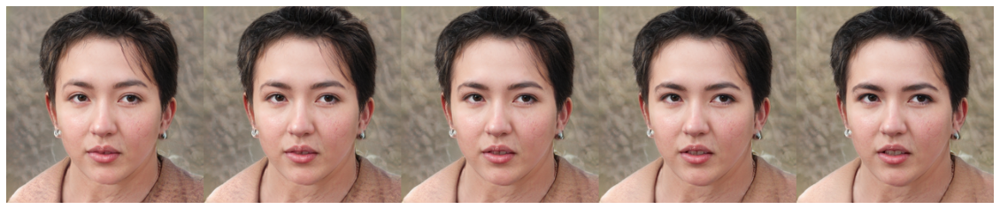

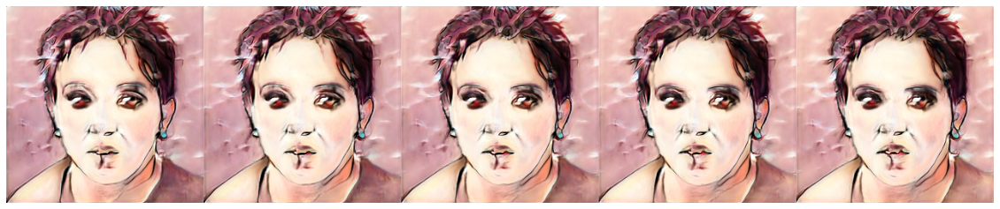

In [3]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "146000" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'./expr/checkpoints/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# ---------------
# Interpolation
# ---------------

number_of_step = 5 #@param {type:"slider", min:0, max:30, step:1}
latent_interp = torch.zeros(number_of_step, latent_init1.shape[1], latent_init1.shape[2]).to(device)
strength = 1.5 #@param {type:"slider", min:1, max:3, step:0.25}
swap = True #@param {type:"boolean"}
swap_layer_num = 4 #@param {type:"slider", min:1, max:6, step:1}


with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent_init1 + strength * (latent_fin1-latent_init1) * float(j/(number_of_step-1))

        imgs_gen1, save_swap_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                randomize_noise=False)
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                truncation_latent=trunc2)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

### **[ Example 2 ]**

I swapped the layer of low resolution to make the structure of the source image more visible.

In [3]:
seed = 456356 #@param {type:"slider", min:0, max:1000000, step:1}

description = 'A sad face with white hair.' #@param {type:"string"}

latent_path = None #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.004 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results2" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": "./expr/checkpoints/414000.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.1,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : "cuda",
    "results_dir": result_dir,
}

In [4]:
from run_optimization import main
from argparse import Namespace

final_result, latent_init2, latent_fin2 = main(Namespace(**args))

loss: 0.7847;: 100%|██████████| 300/300 [00:37<00:00,  7.95it/s]


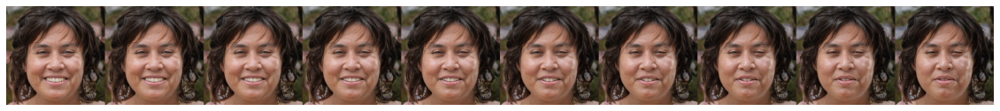

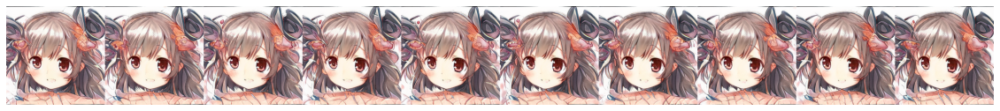

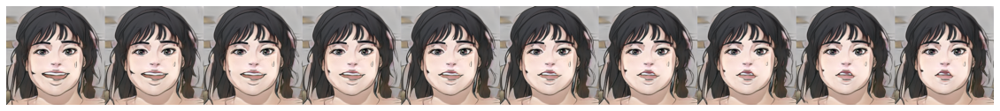

In [9]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "414000" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = f'./expr/checkpoints/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# Generator3
Target_network2 = "NaverWebtoon_StructureLoss" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network3 = f'./networks/{Target_network2}.pt' 
network3 = torch.load(network3)

generator3 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator3.load_state_dict(network3["g_ema"], strict=False)

trunc3 = generator3.mean_latent(4096)

# ---------------
# Interpolation
# ---------------

number_of_step = 10 #@param {type:"slider", min:0, max:10, step:1}
latent_interp = torch.zeros(number_of_step, latent_init2.shape[1], latent_init2.shape[2]).to(device)

strength = 1.25 #@param {type:"slider", min:1, max:3, step:0.25}
swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}


with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent_init2 + strength * (latent_fin2-latent_init2) * float(j/(number_of_step-1))

        imgs_gen1, save_swap_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                randomize_noise=False)
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                truncation_latent=trunc2)
        imgs_gen3, _ = generator3([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                truncation_latent=trunc3)
        
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen3], dim=2)), 20)

### **[ Example 3 ]**

Project your image with a late space and run it !🎉

In [ ]:
from google.colab import files
uploaded = files.upload()
image_name = list(uploaded.keys())[0]
image_name = image_name.split('.')

Saving celea.jpg to celea (1).jpg


In [3]:
image_file_name = 'test-image-2.jpg'
image_name = image_file_name.split('.')

In [5]:
from PIL import Image

im = Image.open(f"./test-image/{image_file_name}")
print(im.size)
im = im.resize((256,256))
im.save(f"./test-image/{image_file_name}")

(256, 256)


In [6]:
#Project your own image and Make Eigenvector of latent spaces (by pretrained model)

!python projector.py --ckpt=./networks/ffhq256.pt --factor='networks/factor' --e_ckpt=./networks/encoder_ffhq.pt \
                            --files=./test-image/test-image-1.jpg 

Traceback (most recent call last):
  File "projector.py", line 185, in <module>
    g_ema.load_state_dict(torch.load(args.ckpt)["g_ema"], strict=False)
  File "/mnt/4TB/tongliang/cartoon-stylegan2/lib/python3.8/site-packages/torch/serialization.py", line 595, in load
    return _legacy_load(opened_file, map_location, pickle_module, **pickle_load_args)
  File "/mnt/4TB/tongliang/cartoon-stylegan2/lib/python3.8/site-packages/torch/serialization.py", line 774, in _legacy_load
    result = unpickler.load()
  File "/mnt/4TB/tongliang/cartoon-stylegan2/lib/python3.8/site-packages/torch/serialization.py", line 730, in persistent_load
    deserialized_objects[root_key] = restore_location(obj, location)
  File "/mnt/4TB/tongliang/cartoon-stylegan2/lib/python3.8/site-packages/torch/serialization.py", line 175, in default_restore_location
    result = fn(storage, location)
  File "/mnt/4TB/tongliang/cartoon-stylegan2/lib/python3.8/site-packages/torch/serialization.py", line 155, in _cuda_deserial

In [4]:
import torch

project = torch.load("./project.pt")
project_result = project[image_name[0]]['latent']
torch.save(project_result, './latent.pt')

project = torch.load('./latent.pt').cuda()
print(project.shape)

torch.Size([1, 14, 512])


In [5]:
seed = 356289 #@param {type:"slider", min:0, max:1000000, step:1}

target_network = 'Romance101' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
description = 'smiling face' #@param {type:"string"}

latent_path = "./latent.pt" #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.004 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results3" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": f"./networks/{target_network}.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.1,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : "cuda",
    "results_dir": result_dir,
}

# -----------------------------

from run_optimization import main
from argparse import Namespace

final_result, latent_init3, latent_fin3 = main(Namespace(**args))


loss: 0.7310;: 100%|██████████| 300/300 [00:37<00:00,  7.99it/s]


In [4]:
# -----------------------------

import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "NaverWebtoon" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# ---------------
# Interpolation
# ---------------

number_of_step = 6 #@param {type:"slider", min:0, max:10, step:1}
latent_interp = torch.zeros(number_of_step, latent_init3.shape[1], latent_init3.shape[2]).to(device)

sample_z_style = torch.randn(number_of_step, 512, device=device)
strength = 1 #@param {type:"slider", min:1, max:5, step:0.5}
swap = True #@param {type:"boolean"}
swap_layer_num = 1 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent_init3 + strength * (latent_fin3-latent_init3) * float(j/(number_of_step-1))
        
        imgs_gen1, save_swap_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                randomize_noise=False)
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc2,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                randomize_noise=True,
                                )
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

NameError: name 'latent_init3' is not defined

# 3. Style Mixing

Inspired by style mixing, I mixed style vectors of two images. Just mixing two different images with different feelings creates a high-quality image.

In [11]:
#@title { display-mode: "form", run: "auto"}


import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'
Target_network = "414000" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
swap = True #@param {type:"boolean"}
save_swap_layer = 2 #@param {type:"slider", min:1, max:6, step:1}

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# latent1
seed1 = 273056 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
latent1 = torch.randn(1, 14, 512, device=device)
latent1 = generator1.get_latent(latent1)


# Generator2
network2=f'./expr/checkpoints/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# latent2
seed2 = 152577 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
latent2 = torch.randn(1, 14, 512, device=device)
latent2 = generator2.get_latent(latent2)

# ---------------
# Interpolation
# ---------------

number_of_step = 6 #@param {type:"slider", min:0, max:10, step:1}
latent_interp = torch.zeros(number_of_step, latent1.shape[1], latent1.shape[2]).to(device)
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

        imgs_gen1, save_extract_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                )
                                
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc2,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                )

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

AttributeError: 'int' object has no attribute 'shape'

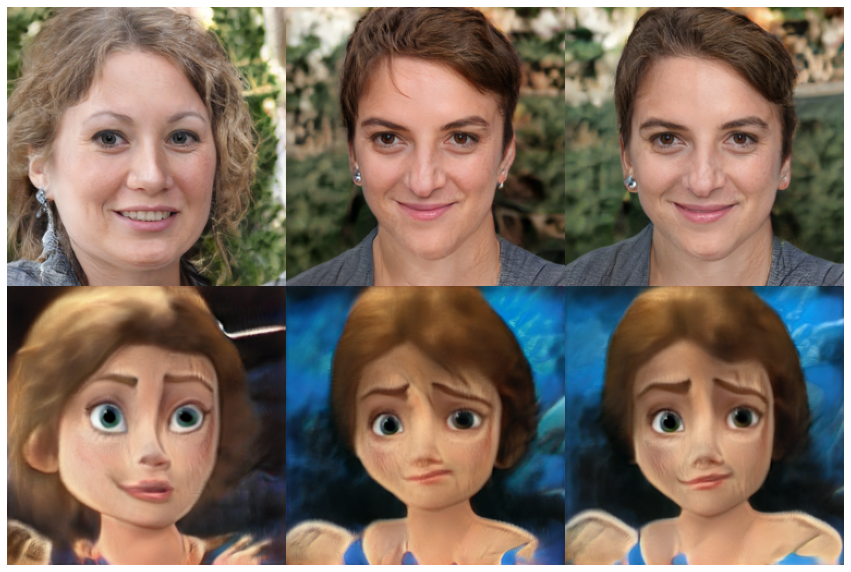

In [3]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'
truncation = 0.7 

target_network ="Disney_StructureLoss" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
swap = False #@param {type:"boolean"}
swap_layer_num = 1 #@param {type:"slider", min:1, max:6, step:1}
# ----------------------
# Source Images (FFHQ)
# ----------------------

network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
trunc1 = g1.mean_latent(4096)

# latent1
seed1 = 124322 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
r_latent1 = torch.randn(1, 14, 512, device=device)
latent1 = g1.get_latent(r_latent1)

# latent2
seed2 = 398741 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
r_latent2 = torch.randn(1, 14, 512, device=device)
latent2 = g1.get_latent(r_latent2)

# latent mixing
latent_mixing1 = 2 #@param {type:"slider", min:0, max:15, step:1}
latent_mixing2 = 12 #@param {type:"slider", min:0, max:15, step:1}

latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:latent_mixing2,:], latent1[:,latent_mixing2:,:]], dim = 1)
# latent4 = torch.cat([latent1[:,:,:latent_mixing2], latent2[:,:,latent_mixing2:]], dim = 2)

# Latent !
latent = torch.cat([latent1, latent2, latent3], dim = 0)

# generate image
img1, save_swap_layer = g1(
    [latent],
    truncation=truncation,
    truncation_latent=trunc1,
    swap=swap, swap_layer_num=swap_layer_num,
    input_is_latent=True,
)

# =================================================

# ----------------------
# Target Images (Cartoon)
# ----------------------

network2 =f'./networks/{target_network}.pt'
#network2 =f'./expr/checkpoints/{target_network}.pt'
network2 = torch.load(network2)

# Genearator2
g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g"], strict=False)
trunc2 = g2.mean_latent(4096)

# generate image

img2, _ = g2(
    [latent],
    input_is_latent=True,
    truncation=truncation,
    truncation_latent=trunc2,
    swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
)

# =================================================

# Show Image

ffhq = torch.cat([img1[0], img1[1], img1[2]], dim=2)
cartoon = torch.cat([img2[0], img2[1], img2[2]], dim=2)

imshow(tensor2image(torch.cat([ffhq, cartoon], dim = 1)), 15)

### Make A Video 📹

In [12]:
#@title  { run: "auto" }

# Save Image
import torch
import os
from utils import make_image
from torchvision.utils import save_image, make_grid
import PIL.Image as pilimg
from model import Generator

device = 'cuda'
truncation = 0.7 

target_network = 'Romance101' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']

# ----------------------
# Source Images (FFHQ)
# ----------------------


network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
trunc1 = g1.mean_latent(4096)

# latent1
seed1 = 627356 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
r_latent1 = torch.randn(1, 14, 512, device=device)
latent1 = g1.get_latent(r_latent1)

# latent2
seed2 = 159972 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
r_latent2 = torch.randn(1, 14, 512, device=device)
latent2 = g1.get_latent(r_latent2)

# latent mixing
latent_mixing1 = 1 #@param {type:"slider", min:0, max:14, step:1}
latent_mixing2 = 419 #@param {type:"slider", min:0, max:512, step:1}

latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:,:]], dim = 1)
latent4 = torch.cat([latent1[:,:,:latent_mixing2], latent2[:,:,latent_mixing2:]], dim = 2)

# Latent !
latent = torch.cat([latent1, latent2, latent3, latent4], dim = 0)


# ----------------------
# Target Images (Cartoon)
# ----------------------

network2=f'./networks/{target_network}.pt'
network2 = torch.load(network2)

# Genearator2
g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g"], strict=False)
trunc2 = g2.mean_latent(4096)




In [13]:
#@markdown Latent Mixing1

if not os.path.isdir('./asset/latent_mix1'):
   os.makedirs('./asset/latent_mix1', exist_ok=True)

for latent_mixing1 in range(15):
    latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:,:]], dim = 1)
    
    latent = torch.cat([latent2, latent1, latent3], dim = 0)

    img1, mix_layer = g1(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc1,
        extract_layer=True, extract_layer_num=1,
    )
    img2, _ = g2(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc2,
        extract_layer=False, extract_layer_num=1, put_layer = mix_layer,
    )

    img_name = "./asset/latent_mix1/latent_mixing1_" + str(latent_mixing1) + ".png"
    grid = make_grid(torch.cat([img1, img2], dim=0),
                    nrow=3,
                    normalize=True,
                    range=(-1,1))

    ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
    im = pilimg.fromarray(ndarr)
    im.save(img_name)



TypeError: forward() got an unexpected keyword argument 'extract_layer'

In [ ]:
#@title  { run: "auto" }


# =====================================

from PIL import Image
import cv2 
from torchvision.utils import save_image
import PIL.Image as pilimg
import numpy as np

img_name = "/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1_0.png"
image = Image.open(img_name)

frameSize = image.size
FPS = 3 #@param {type:"slider", min:0, max:10, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')

video = cv2.VideoWriter('/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1.mp4', fourcc, float(FPS), frameSize)

for i in range(15):

    im = pilimg.open("/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1_" + str(i) + ".png")
    np_img = np.asarray(im)

    frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
    video.write(frame)

video.release()
#--------------------------
# Show a Interpolation Video in Colab
#--------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=700 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
#@markdown Latent Mixing2

if not os.path.isdir('./asset/latent_mix2'):
   os.makedirs('./asset/latent_mix2', exist_ok=True)

for latent_mixing2 in range(64):
    latent3 = torch.cat([latent1[:,:,:latent_mixing2*8], latent2[:,:,latent_mixing2*8:]], dim = 2)
    
    latent = torch.cat([latent2, latent1, latent3], dim = 0)

    img1, mix_layer = g1(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc1,
        extract_layer=True, extract_layer_num=1,
    )
    img2, _ = g2(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc2,
        extract_layer=False, extract_layer_num=1, put_layer = mix_layer,
    )

    img_name = "/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_" + str(latent_mixing2) + ".png"
    grid = make_grid(torch.cat([img1, img2], dim=0),
                    nrow=3,
                    normalize=True,
                    range=(-1,1))

    ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
    im = pilimg.fromarray(ndarr)
    im.save(img_name)



In [ ]:
#@title  { run: "auto" }


# =====================================

from PIL import Image
import cv2 
from torchvision.utils import save_image
import PIL.Image as pilimg
import numpy as np

img_name = "/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_0.png"
image = Image.open(img_name)

frameSize = image.size
FPS = 15 #@param {type:"slider", min:0, max:50, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')

video = cv2.VideoWriter('/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2.mp4', fourcc, float(FPS), frameSize)

for i in range(64):

    im = pilimg.open("/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_" + str(i) + ".png")
    np_img = np.asarray(im)

    frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
    video.write(frame)

video.release()
#--------------------------
# Show a Interpolation Video in Colab
#--------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=700 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [1]:
import torch
from model import Generator
from utils import imshow, tensor2image

device = 'cuda'
truncation = 0.7 

save_latent = False #@param {type:"boolean"}
target_network ="NaverWebtoon_StructureLoss" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
n_sample = 6 #@param {type:"slider", min:1, max:10, step:1}
# latent mixing
latent_mixing1 = 6 #@param {type:"slider", min:0, max:14, step:1}


# ----------------------
# Source Images (FFHQ)
# ----------------------

network1=f'./networks/{target_network}.pt' 
network1 = torch.load(network1)

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
trunc1 = g1.mean_latent(4096)

# latent1
if not save_latent:
  r_latent1 = torch.randn(n_sample, 14, 512, device=device)
  latent1 = g1.get_latent(r_latent1)

# generate image
img1, _ = g1(
    [latent1],
    truncation=truncation,
    truncation_latent=trunc1,
    input_is_latent=True,
)

images = [torch.cat([img for img in img1], 2)]


for i in range(n_sample):
  latent = latent1[i].unsqueeze(0).repeat(n_sample, 1, 1)
  latent2 = torch.cat([latent[:,:latent_mixing1,:], latent1[:,latent_mixing1:,:]], dim = 1)
  
  # generate image
  img1, _ = g1(
      [latent2],
      truncation=truncation,
      truncation_latent=trunc1,
      input_is_latent=True,
  )

  images.append(torch.cat([img for img in img1], 2))

imshow(tensor2image(torch.cat([img for img in images], 1)), 20)

RuntimeError: CUDA out of memory. Tried to allocate 54.00 MiB (GPU 0; 10.73 GiB total capacity; 9.46 GiB already allocated; 6.69 MiB free; 9.58 GiB reserved in total by PyTorch)

## 4. Closed-Form Factorization

In [6]:
!python apply_factor.py --index=7 --degree=14 --seed=123177 --n_sample=5 \
                        --ckpt='./networks/ffhq256.pt' --ckpt2='./networks/798000.pt' \
                        --factor='./factor.pt' --outdir='./asset/results-sefa' --video 



Error: mkl-service + Intel(R) MKL: MKL_THREADING_LAYER=INTEL is incompatible with libgomp.so.1 library.
	Try to import numpy first or set the threading layer accordingly. Set MKL_SERVICE_FORCE_INTEL to force it.


In [ ]:
from IPython.display import Image
Image(open('./asset/results-sefa/video.gif','rb').read())

In [ ]:
#@title { display-mode: "form", run: "auto"}

import torch
import cv2 
import numpy as np
from torchvision.utils import save_image, make_grid
import PIL.Image as pilimg

from model import Generator


device='cuda'
n_sample=5
truncation = 0.7
trunc = 0.7

# Eigen-Vector
factor='/content/Cartoon-StyleGan2/factor.pt'
eigvec = torch.load(factor)["eigvec"].to(device)


# =============================================

# Genearaotr1
network1 = 'ffhq256' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1=f'/content/Cartoon-StyleGan2/networks/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)


# Generator2
network2 = 'TrueBeauty' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'/content/Cartoon-StyleGan2/networks/{network2}.pt' 
network2 = torch.load(network2)

g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g_ema"], strict=False)

# latent
seed = 177838 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed)
latent = torch.randn(n_sample, 14, 512, device=device)
latent = g1.get_latent(latent)

# latent direction & scalar
index=19 #@param {type:"slider", min:0, max:512, step:1}
degree=15 #@param {type:"slider", min:0, max:30, step:1}


# =============================================

# directory to save image
outdir = 'result-sefa' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []

for deg in range(degree):

  direction = 0.5 * deg * eigvec[:, index].unsqueeze(0) #torch.Size([1, 512])

  img1, _ = g1(
      [latent + direction],
      truncation=truncation,
      truncation_latent=trunc,
      input_is_latent=True,
  )

  img2, _ = g2(
      [latent + direction],
      truncation=truncation,
      truncation_latent=trunc,
      input_is_latent=True,
  )


  grid = make_grid(torch.cat([img1, img2], 0),
                   nrow=n_sample,
                   normalize=True,
                   range=(-1,1),
                   )
  ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
  im = pilimg.fromarray(ndarr)
  im.save(f'/content/Cartoon-StyleGan2/asset/{outdir}/out-{deg}.png')



In [ ]:
#@title { display-mode: "form", run: "auto"}

# =============================================

# Setting for Video

im = Image.open(f'/content/Cartoon-StyleGan2/asset/{outdir}/out-0.png')
frameSize = im.size
FPS = 10 #@param {type:"slider", min:0, max:60, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_name = "pose" #@param {type:"string"}

video = cv2.VideoWriter(f'/content/Cartoon-StyleGan2/asset/{outdir}/video-seed{seed}-index{index}-{video_name}.mp4', fourcc, float(FPS), frameSize)

for deg in range(degree):
  im = pilimg.open(f'/content/Cartoon-StyleGan2/asset/{outdir}/out-{deg}.png')
  np_img = np.asarray(im)

  frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
  video.write(frame)
video.release()

#--------------------------------------
# Show a Interpolation Video in Colab
#--------------------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open(f'/content/Cartoon-StyleGan2/asset/{outdir}/video-seed{seed}-index{index}-{video_name}.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=900 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

**Thank you to Naver AI Lab and Professor Yoo Seungjoo for providing good classes and NSML credits !**

# Testing Anime Dataset

In [7]:
import torch
import cv2 
import numpy as np
from torchvision.utils import save_image, make_grid
import PIL.Image as pilimg

from model import Generator

device='cuda'
n_sample=1
truncation = 0.7

# =============================================

# Genearaotr1
network1 = 'ffhq256'  #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1 = f'./networks/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)
trunc1 = g1.mean_latent(4096)

# Generator2
network2 = '798000' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = f'./networks/{network2}.pt' 
#network2 = f'./networks/{network2}.pt'
network2 = torch.load(network2)


g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g_ema"], strict=False)
trunc2 = g2.mean_latent(4096)

# =============================================

# directory to save image
outdir = 'results_kaggle' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []
number_of_img = 11 #@param {type:"slider", min:0, max:30, step:1}
number_of_step = 7 #@param {type:"slider", min:0, max:10, step:1}

swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():

  latent1 = torch.randn(1, 14, 512, device=device)
  latent1 = g1.get_latent(latent1)
  latent_interp = torch.zeros(1, latent1.shape[1], latent1.shape[2]).to(device)

  for i in range(number_of_img):
      # latent1

      latent2 = torch.randn(1, 14, 512, device=device)
      latent2 = g1.get_latent(latent2)

      for j in range(number_of_step):

          latent_interp = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

          imgs_gen1, save_swap_layer = g1([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc1,
                                  swap=swap, swap_layer_num=swap_layer_num,
                                  randomize_noise=False)
          imgs_gen2, _ = g2([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc2,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )

                          
          grid = make_grid(torch.cat([imgs_gen1, imgs_gen2], 0),
                            nrow=2,
                            normalize=True,
                            range=(-1,1),
                            )
          
          ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
          im = pilimg.fromarray(ndarr)
          im.save(f'./asset/{outdir}/out-{i*number_of_step+j}.png')


      latent1 = latent2